## Introduction

One attribute of a crappy photo is human faces (usually the agents faces - there can be more than 1 agent).
OpenCV already has a trained model for us to use to detect a human face. 

Flag the photo as 'crappy' if a human face is detected.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
from imageio import imread
import cv2

### Load the trained model from opencv

In [2]:
face_cascade = cv2.CascadeClassifier('data/trained_model/opencv/haarcascade_frontalface_default.xml')

### Load the test data

In [3]:
crapphotos = pd.read_csv('data/crappy_photos/urls.csv')

### Detect faces using model. Label as `crappy` if detected.

In [4]:
results = []
for i in list(crapphotos.crappy_photos_url):
    img = imread(i)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    if len(faces) > 0:
        r = {"url":i, "verdict":"crappy"}
    else:
        r = {"url":i, "verdict":"not crappy"}
    results.append(r)

### Eyeball perfomance

In [5]:
results_df = pd.DataFrame(results)
false_neg = results_df[results_df.verdict=="not crappy"]
true_pos = results_df[results_df.verdict=="crappy"]

#### 1. false negative cases

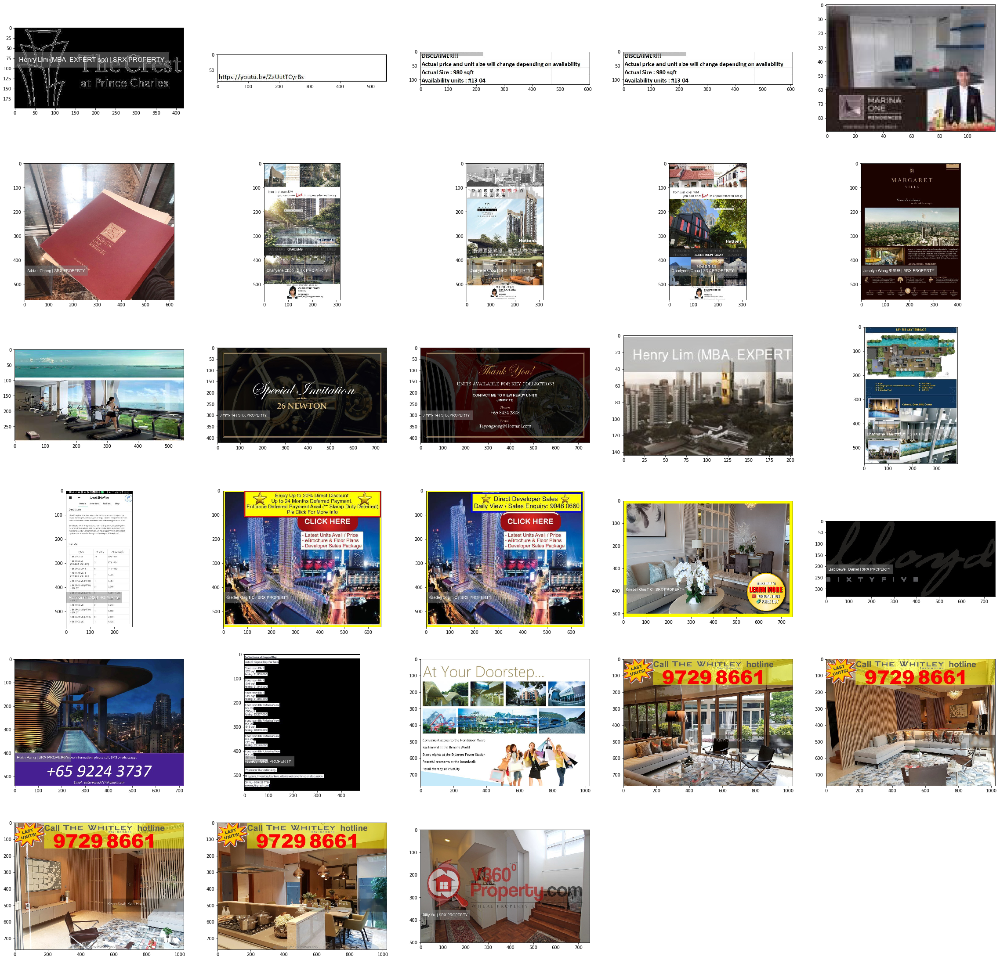

In [6]:
plt.figure(figsize=(40,40))
col = 5
row = int(len(false_neg)/col)+1
for n, i in enumerate(false_neg.url):
    ax = plt.subplot(row,col,n+1)
    img = imread(i)
    ax.imshow(img)
    

#### ii. true positive cases

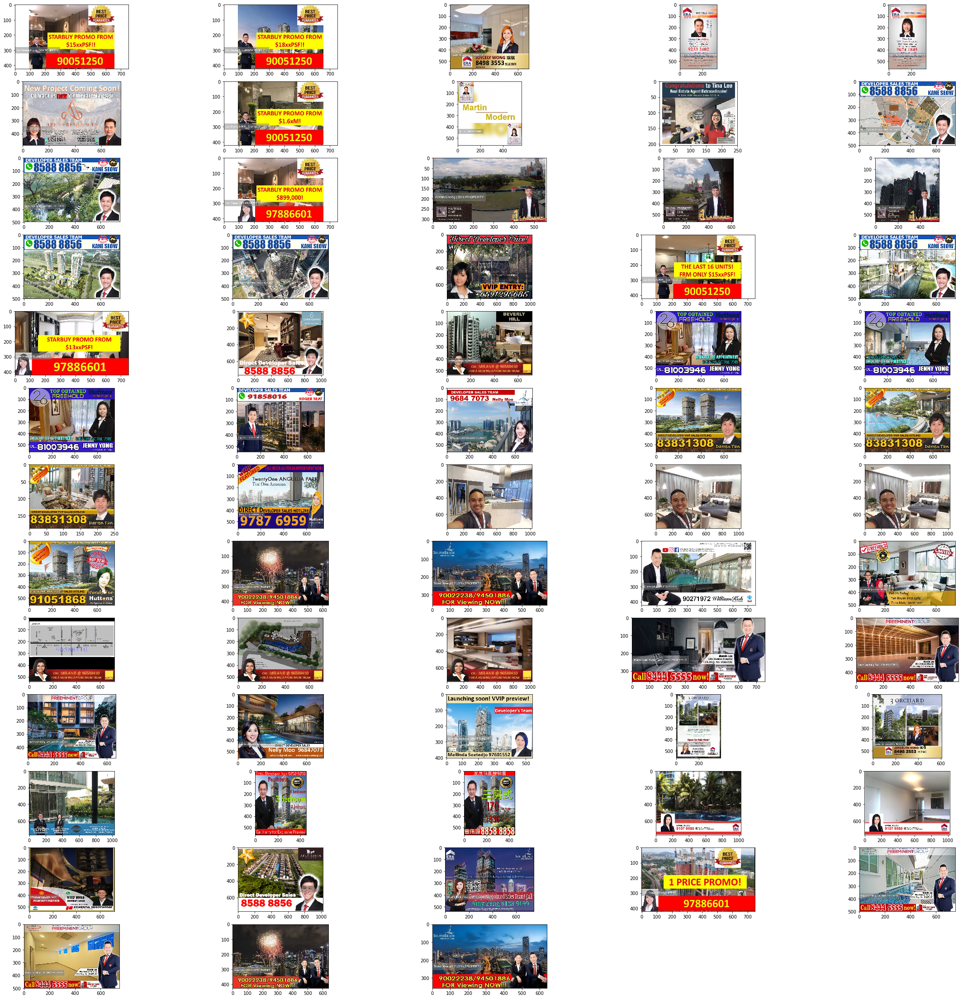

In [7]:
plt.figure(figsize=(40,40))
col = 5
row = int(len(true_pos)/col)+1
for n, i in enumerate(true_pos.url):
    ax = plt.subplot(row,col,n+1)
    img = imread(i)
    ax.imshow(img)

## Detect words

### Detect texts from false_negative results using PyTesseract. Label as `crappy` if detected.

In [8]:
import requests
from io import BytesIO

try:
    from PIL import Image
except ImportError:
    import Image
import pytesseract

In [9]:
results = []

In [10]:
for each in false_neg['url']:
    response = requests.get(each)
    imgfile = BytesIO(response.content)
    open_img = Image.open(imgfile)
    text = pytesseract.image_to_string(open_img)
    if len(text) > 0:
            r = {"url":each, "text":text, "verdict": "crappy"}
    else:
            r = {"url":each, "text":text, "verdict": "not crappy"}
    results.append(r)

#### Detect chinese characters

In [11]:
text_results_df = pd.DataFrame(results)
false_neg = text_results_df[text_results_df.verdict=="not crappy"]
true_pos = text_results_df[text_results_df.verdict=="crappy"]

In [12]:
text_results_df

,text,url,verdict
0,i\n\nEmm alas Ruta),https://s3-ap-southeast-1.amazonaws.com/static...,crappy
1,https://youtu.be/ZaUutTCyrBs,https://s3-ap-southeast-1.amazonaws.com/static...,crappy
2,DISCLAIMER!!!\n\nActual price and unit size wi...,https://s3-ap-southeast-1.amazonaws.com/static...,crappy
3,DISCLAIMER!!!\n\nActual price and unit size wi...,https://s3-ap-southeast-1.amazonaws.com/static...,crappy
4,,https://s3-ap-southeast-1.amazonaws.com/static...,not crappy
5,,https://s3-ap-southeast-1.amazonaws.com/static...,not crappy
6,Charlyene Choo ss PROPERTY\nweal cane /\n\nCCH...,https://s3-ap-southeast-1.amazonaws.com/static...,crappy
7,,https://s3-ap-southeast-1.amazonaws.com/static...,not crappy
8,,https://s3-ap-southeast-1.amazonaws.com/static...,not crappy
9,NI\nMARGARET\n\nNam:\n\n \n\ned\n\nAe NNN Ess ...,https://s3-ap-southeast-1.amazonaws.com/static...,crappy


In [13]:
text_results_df['url'][7]

'https://s3-ap-southeast-1.amazonaws.com/static.streetsine/Listing%20Photos/Circle/81852052/L/187916072_mobile.jpg?20181130145045'

In [14]:
import requests
from io import BytesIO

try:
    from PIL import Image
except ImportError:
    import Image
import pytesseract

def ocr_core(urls):
    """
    This function will handle the core OCR processing of images.
    """
    results = []
    for each in urls:
        response = requests.get(each)
        imgfile = BytesIO(response.content)
        text = pytesseract.image_to_string(Image.open(imgfile))  # We'll use Pillow's Image class to open the image and pytesseract to detect the string in the image
        if len(text) > 0:
            r = {"url":each, "text":text, "verdict": "crappy"}
        else:
            r = {"url":each, "text":text, "verdict": "not crappy"}
        results.append(r)

    return results

In [15]:
text_results_df = pd.DataFrame(ocr_core(false_neg['url']))
false_neg = text_results_df[text_results_df.verdict=="not crappy"]
true_pos = text_results_df[text_results_df.verdict=="crappy"]

### Eyeball performance

#### false negative cases

NameError: name 'fig' is not defined

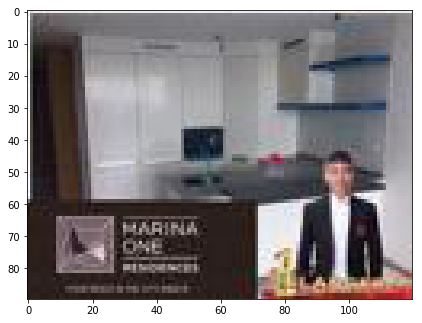

In [16]:
#filter from not crappy photos
plt.figure(figsize=(40,40))
col = 5
row = int(len(false_neg)/col)+1
for n, i in enumerate(false_neg.url):
    ax = plt.subplot(row,col,n+1)
    img = imread(i)
    ax.imshow(img)
    txt="I need the caption to be present a little below X-axis"
    fig.text(.5, .05, txt, ha='center')

In [ ]:
plt.figure(figsize=(40,40))
col = 5
row = int(len(true_pos)/col)+1
for n, i in enumerate(true_pos.url):
    ax = plt.subplot(row,col,n+1)
    img = imread(i)
    ax.imshow(img)

In [19]:
url = 'https://res.cloudinary.com/teepublic/image/private/s--fKVT7uoB--/t_Preview/b_rgb:ffffff,c_limit,f_jpg,h_630,q_90,w_630/v1534691415/production/designs/3041203_0.jpg'
response = requests.get(url)
imgfile = BytesIO(response.content)
text = pytesseract.image_to_string(Image.open(imgfile), lang='chi_sim')

In [20]:
text

'人\nLoyajty'

In [50]:
imgfile = imread('https://s3-ap-southeast-1.amazonaws.com/static.streetsine/Listing%20Photos/Circle/83057872/L/208655701.jpg?20190826115357')
gray = cv2.cvtColor(imgfile, cv2.COLOR_BGR2GRAY)
for n in range(10):
    text = pytesseract.image_to_string(imgfile, nice=n,)
    print(text)
#text = pytesseract.image_to_string(imgfile, lang='chi_sim')



In [45]:
print (text)

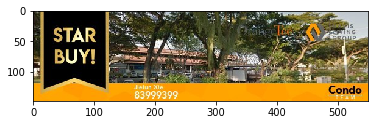

In [49]:
ax = plt.subplot(111)

ax.imshow(imgfile)